Basic Walkthrough:
     1) Define everything
     2) Create master bias file, Save master bias file  
     3) Open all other files, sub master bias, save  (*c?.b.fits)
     4) Remove cosmics from all file types except bias  (*c?.bc.fits)
     5) Open flats and create master skyflat file, save
     6) Open all remainging types and divide out master flat, then save  (*c?.bcf.fits)
     7) Open all remaining types and stitch together, save  (*full.bcf.fits)
     8) Use fibermap files to determine aperatures
     9) Use aperatures to cut out same regions in thar,comp,science
     10) Save all 256 to files with their header tagged name in filename, along with fiber num
     11) Assume no curvature within tiny aperature region; fit profile to 2d spec and sum to 1d
     12) Fit the lines in comp spectra, save file and fit solution
     13) Try to fit lines in thar spectra, save file and fit solution
     14) Apply to science spectra

In [27]:
import os
import numpy as np
from astropy.io import fits
import matplotlib.pyplot as plt

import cv2
from scipy.signal import medfilt
from scipy.signal import argrelmin, argrelmax, argrelextrema

%matplotlib inline
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


### Define input file numbers and other required information

Ex:

    Bias 597-626
    ThAr 627,635
    NeHgArXe 628,629,636,637
    Science 631-634
    Fibermaps 573-577


In [2]:
thar_lamps = np.asarray([627,635])
comp_lamps = np.asarray([628,629,636,637])
sciences = np.arange(631,634+1).astype(int)

In [3]:
instrument = 'M2FS'
mask_name = 'A02'
cal_lamp = ['Xenon', 'Argon', 'HgNe']  # 'Xenon','Argon','Neon', 'HgNe'
cameras = ['r']
opamps = [1,2,3,4]

In [4]:
path_to_masks = os.path.abspath('../../OneDrive/Research/M2FSReductions')
mask_subdir = mask_name
raw_data_subdir =  'raw_data'
raw_filename_template = '{cam}{filenum:04d}c{opamp}.fits'

###         Beginning of Code

In [5]:
date = np.datetime_as_string(np.datetime64('today', 'D'))

In [6]:
mask_dir = os.path.join(path_to_masks,mask_subdir)

In [7]:
raw_data_dir =     os.path.join(mask_dir, raw_data_subdir)
raw_stitched_dir = os.path.join(mask_dir,'raw_stitched')
product_dir =      os.path.join(mask_dir,'data_products')
twod_dir =         os.path.join(mask_dir,'twods')
oned_dir =         os.path.join(mask_dir,'oneds')
calibrated_dir =   os.path.join(mask_dir,'calibrated_oned')
summedspec_dir =   os.path.join(mask_dir,'final_oned')
zfit_dir =         os.path.join(mask_dir,'zfits')

for folder in [ raw_data_dir, raw_stitched_dir, product_dir, twod_dir, 
    oned_dir, calibrated_dir, summedspec_dir, zfit_dir]:
    if not os.path.exists(folder):
        os.makedirs(folder)

In [8]:
fibermap_array_dict, fibermap_header_dict = None,None
twiflat_array_dict, twiflat_header_dict = None,None
bias_array_dict, bias_header_dict = None,None

In [9]:
headers = None
data = None
master_aux_data = {}
master_aux_headers = {}

In [10]:
filenumbers = {'thar':thar_lamps, 'comp': comp_lamps, 'science': sciences}

In [11]:
base_file_template =          '{cam}_{imtype}_{filenum:04d}_{maskname}_'
stitched_filename_template =  base_file_template+'stitched{tags}.fits'
twod_filename_template =      base_file_template+'{fibername}_2d{tags}.fits'
oned_filename_template =      base_file_template+'{fibername}_1d{tags}.fits'
combined_filename_template =  base_file_template+'{fibername}_combined_1d{tags}.fits'

master_stitched_fname_template =  '{cam}_master{imtype}_{maskname}_stitched{tags}.fits'

In [20]:
common_info =      {    'maskname':         mask_name,
                        'cameras':          cameras,
                        'opamps':           opamps, 
                        'date':             date,
                        'datadir':          raw_data_dir,
                        'template':         raw_filename_template,
                        'master_template':  master_stitched_fname_template,
                        'master_types':     [],
                        'tags':             ''                      }

In [24]:
## fast forward to apcut
common_info['master_types'] = ['fibmap','twiflat']#,,'bias']
common_info['tags'] = '.bc'
common_info['datadir'] = product_dir
common_info['template'] = stitched_filename_template
common_info['opamps'] = None

In [25]:
from quickreduce_funcs import get_all_filedata
data, headers = get_all_filedata( filenum_dict=filenumbers, **common_info )
camera = 'r'

In [93]:
for key1,val1 in data.items():
    print(key1)
    for key2,val2 in val1.items():
        print("\t{}".format(key2))
        if type(val2) is dict:
            for key3,val3 in val2.items():
                print("\t\t{}".format(key3))
                if type(val3) is dict:
                    for key4,val4 in val3.items():
                        print("\t\t\t{}".format(key4))
                        print("\t\t\t\tdatatype = {}".format(type(val4)))
                        if type(val4) is np.ndarray:
                            print("\t\t\t\tdatashape = ({},{})".format(*val4.shape))
                else:
                    print("\t\t\tdatatype = {}".format(type(val3)))
                    if type(val3) is np.ndarray:
                        print("\t\t\tdatashape = ({},{})".format(*val3.shape))
                        

thar
	r
		627
			datatype = <class 'numpy.ndarray'>
			datashape = (2056,2048)
		635
			datatype = <class 'numpy.ndarray'>
			datashape = (2056,2048)
comp
	r
		628
			datatype = <class 'numpy.ndarray'>
			datashape = (2056,2048)
		629
			datatype = <class 'numpy.ndarray'>
			datashape = (2056,2048)
		636
			datatype = <class 'numpy.ndarray'>
			datashape = (2056,2048)
		637
			datatype = <class 'numpy.ndarray'>
			datashape = (2056,2048)
science
	r
		631
			datatype = <class 'numpy.ndarray'>
			datashape = (2056,2048)
		632
			datatype = <class 'numpy.ndarray'>
			datashape = (2056,2048)
		633
			datatype = <class 'numpy.ndarray'>
			datashape = (2056,2048)
		634
			datatype = <class 'numpy.ndarray'>
			datashape = (2056,2048)
fibmap
	r
twiflat
	r


In [39]:
img = data['fibmap'][camera]
science_img = data['science'][camera][632].copy()
comp_img = data['comp'][camera][636].copy()


In [41]:
from app_detection_helper_funcs import imageset,show_image,gauss,\
                                        fortran_ind_range,get_all_tetris_edges,\
                                        get_extrema
from scipy.signal import argrelmin, argrelmax, argrelextrema

In [42]:
fibermap = imageset(img)
science = imageset(science_img)
comparison_arc = imageset(comp_img)

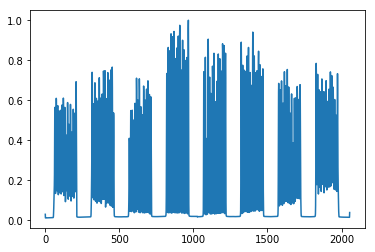

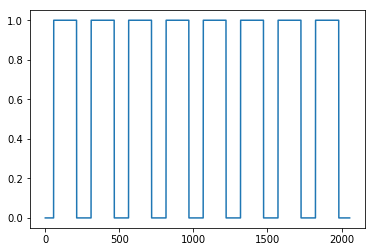

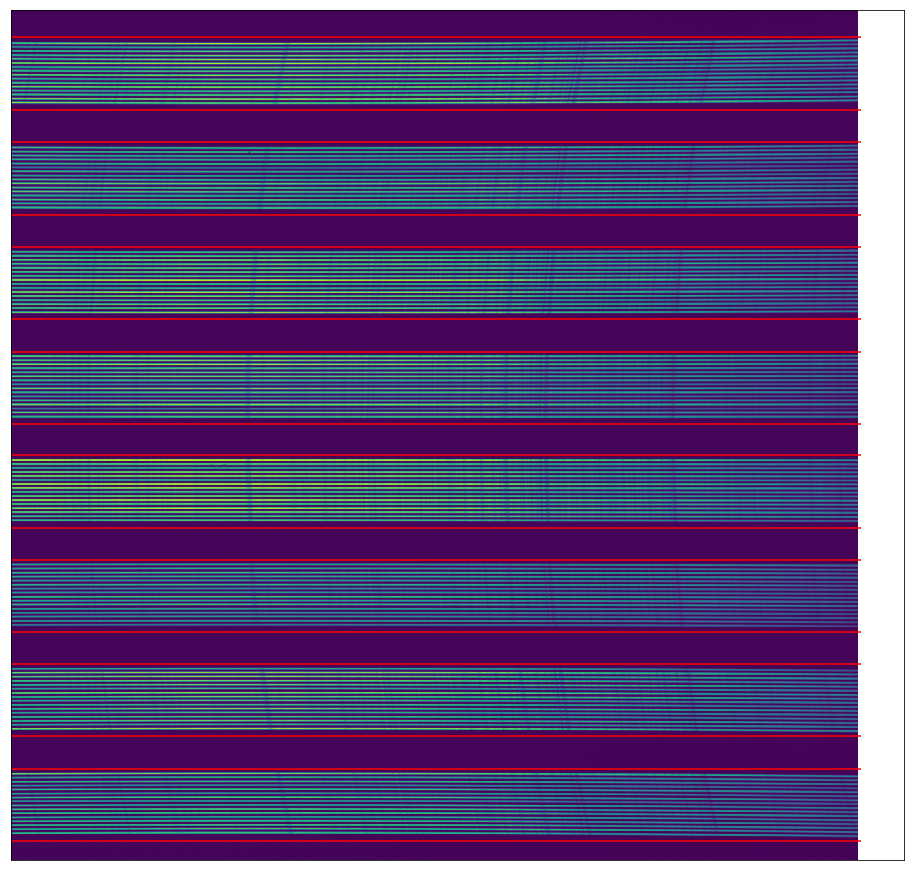

In [44]:
starts,ends = get_all_tetris_edges(fibermap['zerod'])

In [45]:
fibermap['zerod'].shape

(2056, 2048)

Start,end = 46,221
Tetris: 1


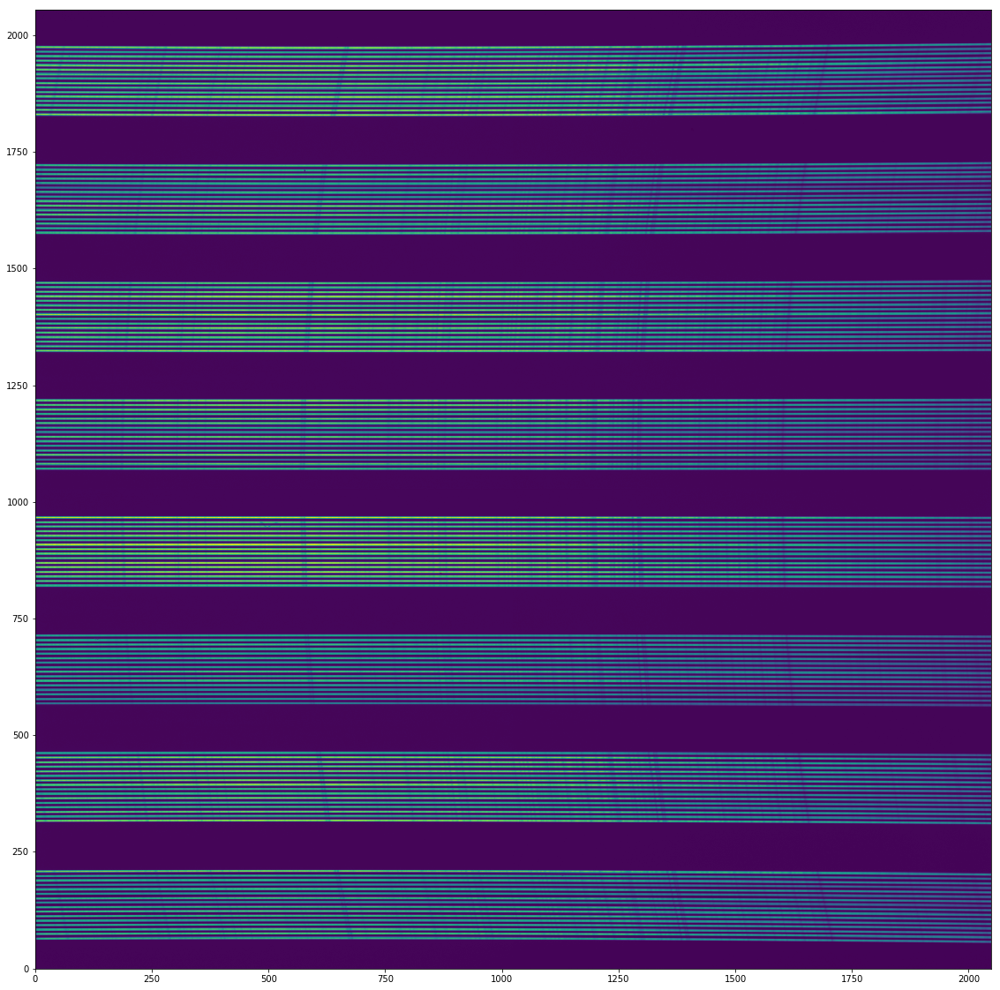

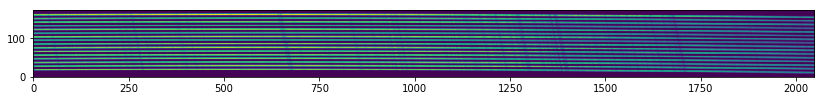

Start,end = 299,474
Tetris: 2


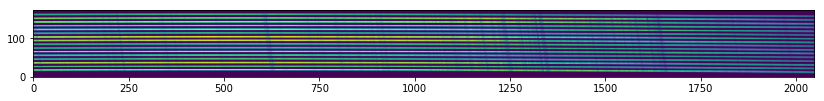

Start,end = 552,727
Tetris: 3


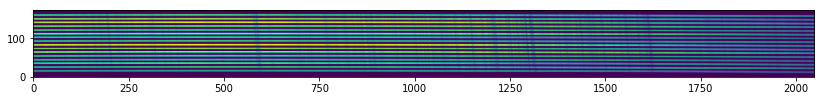

Start,end = 804,979
Tetris: 4


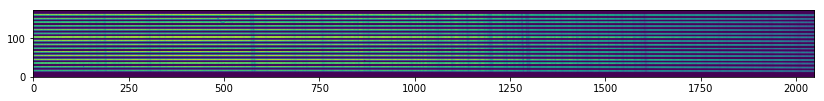

Start,end = 1055,1230
Tetris: 5


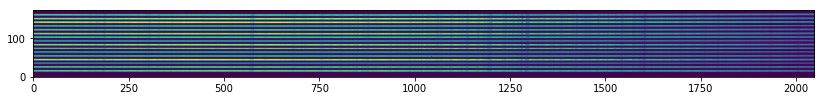

Start,end = 1308,1483
Tetris: 6


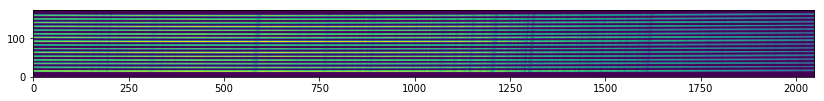

Start,end = 1561,1736
Tetris: 7


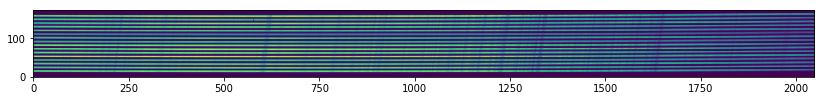

Start,end = 1815,1990
Tetris: 8


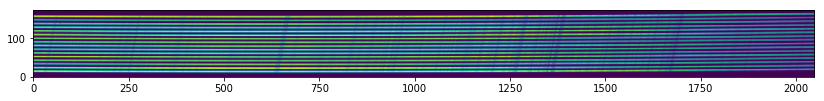

Start to end length of tetris is: 175


In [49]:
fibm_tetri = {}
sci_tetri = {}
comp_tetri = {}
tetri_masks = {}

if camera.lower() == 'r':
    tetris_number = 1
elif camera.lower() == 'b':
    tetris_number = 8
else:
    print("Didn't understand the camera name")

plt.figure(),plt.subplots(1,1,figsize=(20,20))
plt.imshow(fibermap['zerod'],origin='lower-left')

for start,end in zip(starts,ends):
    print("Start,end = {},{}".format(start,end))
    fibtet = fibermap['zerod'][start:end,:].copy()
    scitet = science['zerod'][start:end,:].copy()
    comptet = comparison_arc['zerod'][start:end,:].copy()
    tetmask = np.zeros(shape = comparison_arc['zerod'].shape,dtype=bool)
    tetmask[start:end,:] = True

    fibm_tetri[tetris_number] = fibtet/fibtet.max()
    sci_tetri[tetris_number] = scitet
    comp_tetri[tetris_number] = comptet
    tetri_masks[tetris_number] = tetmask
    
    print("Tetris: {}".format(tetris_number))
    plt.figure(),plt.subplots(1,1,figsize=(14,20))
    plt.imshow(fibtet,origin='lower-left')
    plt.show()
    
    if camera.lower() == 'r':
        tetris_number += 1
    elif camera.lower() == 'b':
        tetris_number -= 1

print("Start to end length of tetris is: {}".format(end-start))
#show_image(comptet)

In [56]:
ntetri = len(fibm_tetri.items())
nappers = np.zeros(ntetri)
nsteps = 2**6
stepsize = int(fibm_tetri[1].shape[1]/nsteps)
xcoords = np.zeros(shape=(ntetri,nsteps))
ymin_aps = np.zeros(shape=(ntetri,nsteps,17))
ymax_locs =  np.zeros(shape=(ntetri,nsteps,16))
compact_slices = np.zeros(shape=(ntetri,nsteps,fibm_tetri[1].shape[0]))


for i in range(1,ntetri+1):
    tetras_image = fibm_tetri[i]
    for j in range(nsteps):
        curslice = tetras_image[:,j*stepsize:(j+1)*stepsize]
        compact_slice = curslice.sum(axis=1)
        compact_slices[i-1,j] = compact_slice    
        ymins, ymaxs = get_extrema(compact_slice)
        mean_x = (j+0.5)*stepsize

        xcoords[i-1,j] = mean_x
        ymin_aps[i-1,j,:] = ymins
        ymax_locs[i-1,j,:] = ymaxs

changing from 8 to 13
changing from 171 to 167
changing from 4 to 13
changing from 1 to 13
changing from 172 to 167
changing from 1 to 13
changing from 173 to 167
changing from 3 to 14
changing from 171 to 167
changing from 2 to 14
changing from 2 to 14
changing from 1 to 14
changing from 1 to 14
changing from 169 to 167
changing from 1 to 14
changing from 169 to 167
changing from 1 to 14
changing from 169 to 167
changing from 1 to 14
changing from 173 to 168
changing from 1 to 14
changing from 172 to 168
changing from 1 to 14
changing from 173 to 168
changing from 3 to 14
changing from 1 to 14
changing from 173 to 168
changing from 3 to 14
changing from 1 to 14
changing from 173 to 168
changing from 2 to 14
changing from 172 to 168
changing from 3 to 14
changing from 172 to 168
changing from 1 to 14
changing from 2 to 14
changing from 3 to 14
changing from 2 to 14
changing from 171 to 168
changing from 1 to 14
changing from 173 to 168
changing from 1 to 14
changing from 169 to 167
cha

changing from 1 to 11
changing from 173 to 167
changing from 3 to 11
changing from 171 to 167
changing from 3 to 11
changing from 172 to 167
changing from 1 to 11
changing from 171 to 167
changing from 3 to 11
changing from 172 to 167
changing from 1 to 10
changing from 5 to 10
changing from 171 to 167
changing from 12 to 10
changing from 3 to 10
changing from 172 to 167
changing from 1 to 10
changing from 172 to 167
changing from 2 to 10
changing from 172 to 167
changing from 1 to 10
changing from 170 to 166
changing from 2 to 10
changing from 173 to 166
changing from 1 to 10
changing from 172 to 166
changing from 1 to 10
changing from 171 to 166
changing from 171 to 166
changing from 2 to 10
changing from 173 to 166
changing from 2 to 10
changing from 172 to 166
changing from 1 to 10
changing from 173 to 166
changing from 2 to 10
changing from 170 to 166
changing from 5 to 10
changing from 172 to 166
changing from 2 to 10
changing from 173 to 166
changing from 1 to 10
changing from 1

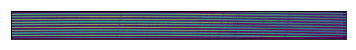

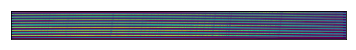

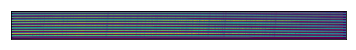

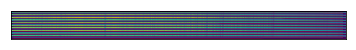

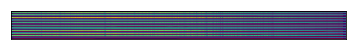

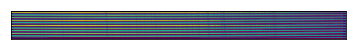

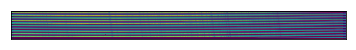

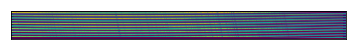

In [59]:
plt.figure()

for i in range(1,ntetri+1):
    tetras_image = fibm_tetri[i]
    plt.figure()
    plt.imshow(tetras_image)
    for j in range(17):
        plt.plot(xcoords[i-1],ymin_aps[i-1,:,j],'r-',linewidth=0.2)
    for j in range(16):
        plt.plot(xcoords[i-1],ymax_locs[i-1,:,j],'c-',linewidth=0.2)
    plt.yticks([])
    plt.xticks([])
    plt.show()
    #plt.savefig('aperature.png',dpi=1200,bbox_inches='tight', transparent="True", pad_inches=0)

In [60]:
from scipy.optimize import curve_fit
from scipy.interpolate import CubicSpline
from scipy.interpolate import InterpolatedUnivariateSpline as IUS
from scipy.interpolate import UnivariateSpline as US
def recursive_poly(x,order,params):
    if order == 0:
        return params
    elif order == 1:
        return recursive_poly(x,order-1,params[0])*x+params[-1]
    else:
        return recursive_poly(x,order-1,params[:-1])*x+params[-1]

def recursive_poly_np(x,order,params):
    return np.asarray(recursive_poly(x,order,params)).astype(np.float64)

def quad(x,a,b,c):
    return recursive_poly_np(x,2,[a,b,c])
def fourthorder(x,a,b,c,d,e):
    return recursive_poly_np(x,4,[a,b,c,d,e])
def sixthorder(x,a,b,c,d,e,f,g):
    return recursive_poly_np(x,6,[a,b,c,d,e,f,g])
def eighthorder(x,a,b,c,d,e,f,g,h,i):
    return recursive_poly_np(x,8,[a,b,c,d,e,f,g,h,i])
def tenthorder(x,a,b,c,d,e,f,g,h,i,j,k):
    return recursive_poly_np(x,10,[a,b,c,d,e,f,g,h,i,j,k])

fitter_func_switch = {2:quad, 4:fourthorder, 6: sixthorder, 8:eighthorder, 10:tenthorder}


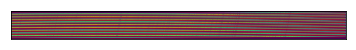

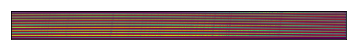

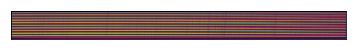

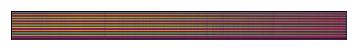

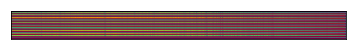

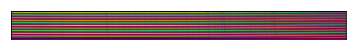

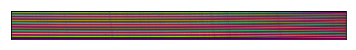

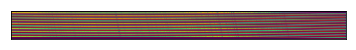

In [72]:
all_fit_mins = {}
all_fit_maxs = {}
all_lower_apps = {}
all_upper_apps = {}
all_cutouts = {}
all_masks = {}

dopoly = True
function_order = 4

if dopoly:
    dospline = False
    fitfunc = fitter_func_switch[function_order]
    p0 = [0.001]*(function_order+1)#,0.001,0.001,0.001,0.001,0.001,0.001)
else:
    dospline = True
    
for i in range(1,ntetri+1):
    fit_mins,fit_maxs = {},{}
    lower_apps = {}
    upper_apps = {}
    cutouts = {}
    masks = {}
    tetris_image = fibm_tetri[i]
    xpix = np.arange(tetris_image.shape[1])
    plt.figure(),plt.subplots(1,1,figsize=(20,20))
    plt.imshow(tetris_image)
    plt.yticks([])
    plt.xticks([])
    itter_xcoords = xcoords[i-1].astype(np.float64)
    p0[-1] = 5
    if dopoly:
        fit_min_0 = curve_fit(fitfunc, xcoords[i-1], ymin_aps[i-1,:,0],  p0=p0 )[0]
    else: #dospline
        fit_min_0 = US(itter_xcoords,ymin_aps[i-1,:,0].astype(np.float64),s=3*len(xcoords[i]) )
    fit_mins[0] = [0,fit_min_0]
    for j in range(1,16+1):
        fit_min1 = fit_mins[j-1][1]
        if dopoly:    
            p0[-1] = 10*j+5
            fit_min2 = curve_fit(fitfunc, xcoords[i-1], ymin_aps[i-1,:,j],    p0=p0)[0]
            p0[-1] = 10*j
            fit_max  = curve_fit(fitfunc, xcoords[i-1], ymax_locs[i-1,:,j-1], p0=p0)[0]
            fllows = fitfunc(xpix.astype(float),*fit_min1)
            flhighs = fitfunc(xpix,*fit_min2)        
            plt.plot(xpix,fitfunc(xpix,*fit_min1),'r-',linewidth=0.2)
            plt.plot(xpix,fitfunc(xpix,*fit_min2),'r-',linewidth=0.2)
            plt.plot(xpix,fitfunc(xpix,*fit_max),'y-',linewidth=0.2)
        elif dospline:
            fit_min2 = US(itter_xcoords, ymin_aps[i-1,:,j].astype(np.float64),s=3*len(xcoords[i]) )
            fit_max = US(itter_xcoords, ymax_locs[i-1,:,j-1].astype(np.float64),s=3*len(xcoords[i]) )
            fllows = fit_min1(xpix)
            flhighs = fit_min2(xpix)
            plt.plot(xpix,fllows,'r-',linewidth=0.2)
            plt.plot(xpix,flhighs,'r-',linewidth=0.2)
            plt.plot(xpix,fit_max(xpix),'y-',linewidth=0.2)
        
        lows = np.floor(fllows).astype(int)
        highs = np.ceil(flhighs).astype(int)
        size = np.max(np.abs(highs-lows)).astype(int)
        cutout_array = np.zeros(shape=(size,xpix.size))
        aperature_mask = np.zeros(shape = tetris_image.shape).astype(bool)
        for low,high,x in zip(lows,highs,xpix):
            cutout_array[:np.abs(low-high),x] = tetris_image[low:high,x]
            aperature_mask[low:high,x] = True
        
        cutouts[j] = cutout_array
        masks[j] = aperature_mask
        lower_apps[j] = fllows
        upper_apps[j] = flhighs
        fit_mins[j] = [fit_min1,fit_min2]
        fit_maxs[j] = fit_max
    fit_mins.pop(0)
    plt.savefig('./apps/aperaturefit{}.png'.format(i),dpi=800,bbox_inches='tight', transparent="True", pad_inches=0)
    all_fit_mins[i] = fit_mins
    all_fit_maxs[i] = fit_maxs
    all_lower_apps[i] = lower_apps
    all_upper_apps[i] = upper_apps
    all_cutouts[i] = cutouts
    all_masks[i] = masks


In [73]:
print(all_lower_apps[1][1][2])

13.0347699113


In [74]:
# all_compcutouts = {}
# all_componeds = {}
all_scicutouts = {}
all_scioneds = {}
resol_factor = 100

    
for i in range(1,ntetri+1):
    lower_apps = all_lower_apps[i]
    upper_apps = all_upper_apps[i]
    sci_cutouts = {}
    sci_oneds = {}
    tetris_image = sci_tetri[i]
    # comp_cutouts = {}
    # comp_oneds = {}
    # tetris_image = comp_tetri[i]
    hyperres = np.ndarray(shape=(tetris_image.shape[0]*resol_factor,tetris_image.shape[1]))
    for row in range(tetris_image.shape[0]):
        hyperres[resol_factor*row:resol_factor*(row+1),:] = tetris_image[row,:]/resol_factor
    
    xpix = np.arange(tetris_image.shape[1])

    for j in range(1,16+1):
        lows,highs = resol_factor*np.asarray(lower_apps[j]),resol_factor*np.asarray(upper_apps[j])
        lows = np.floor(lows).astype(int)
        highs = np.ceil(highs).astype(int)
        maxwidth = np.max(np.abs(highs-lows))+1
        cutout_array = np.zeros(shape=(maxwidth,tetris_image.shape[1]))
        cut_mid = maxwidth//2
        #plt.figure()
        #plt.plot(xpix,lows,'r-')
        #plt.plot(xpix,highs,'b-')
        
        lbs = []
        ubs = []
        for low,high,x in zip(lows,highs,xpix):
            npix = np.abs(low-high) + 1
            halfpix = npix//2
            lowerbound = cut_mid-halfpix
            upperbound = cut_mid+(npix-halfpix)
            lbs.append(lowerbound)
            ubs.append(upperbound)
            if npix == maxwidth:
                cutout_array[:,x] = hyperres[low:high+1,x]
            else:
                cutout_array[lowerbound:upperbound,x] = hyperres[low:high+1,x]
        oned = cutout_array.sum(axis=0)
        # plt.plot(xpix,lbs,'r-.')
        # plt.plot(xpix,ubs,'b-.')
        # plt.show()
        # plt.figure()
        # plt.imshow(cutout_array)
        # plt.xticks([]), plt.yticks([])
        # plt.savefig('./apps/sci_aperaturefit{}{:02d}.png'.format(i,j),dpi=800,bbox_inches='tight', transparent="True", pad_inches=0)
        # plt.close()

        # plt.figure()
        # plt.plot(range(len(oned)),oned[::-1],'b-')
        # plt.ylim([0,np.median(oned)*3])
        # plt.show()
        # plt.close()         
        # comp_cutouts[j] = cutout_array
        # comp_oneds[j] = oned
        sci_cutouts[j] = cutout_array
        sci_oneds[j] = oned
        
    # all_compcutouts[i] = comp_cutouts
    # all_componeds[i]   = comp_oneds
    all_scicutouts[i] = sci_cutouts
    all_scioneds[i]   = sci_oneds
    plt.close('all')

In [ ]:
comp_copy = comparison_arc['zerod']

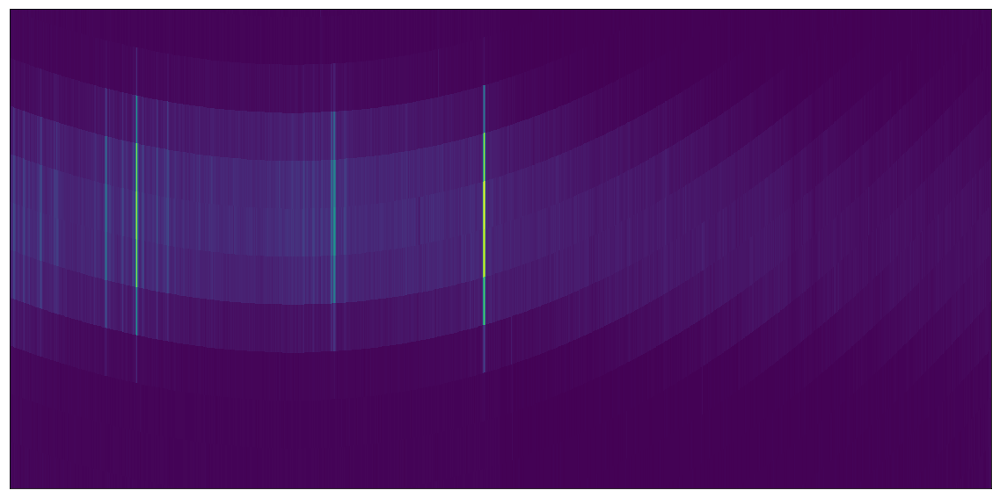

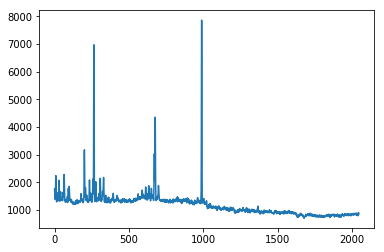

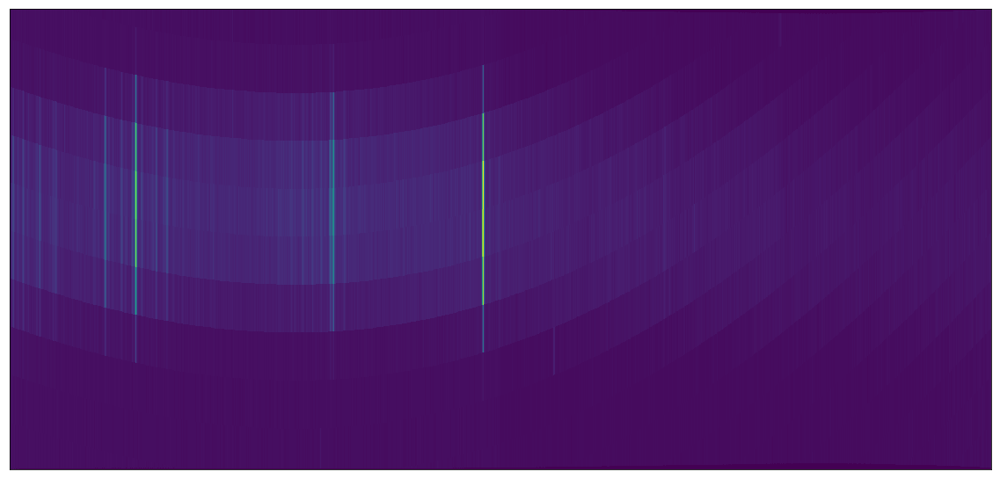

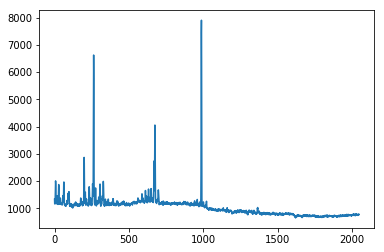

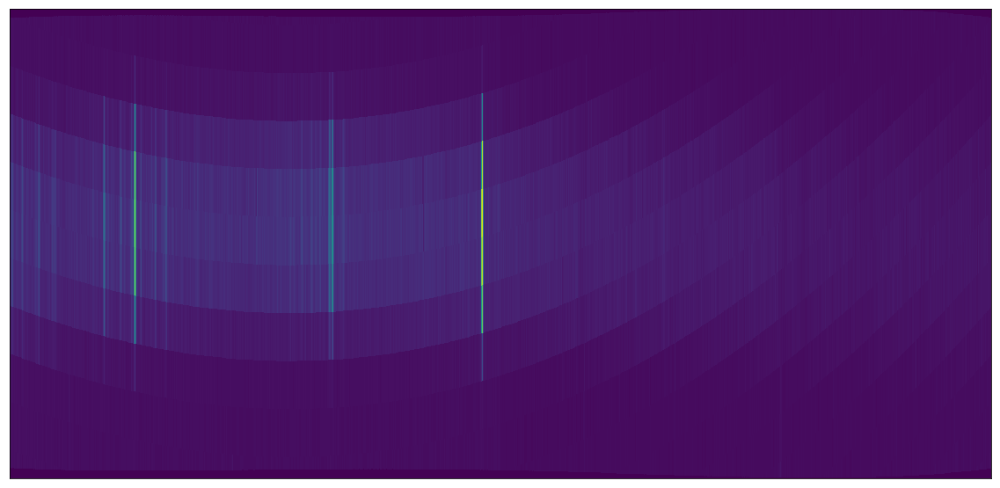

...

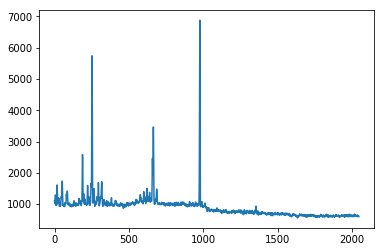

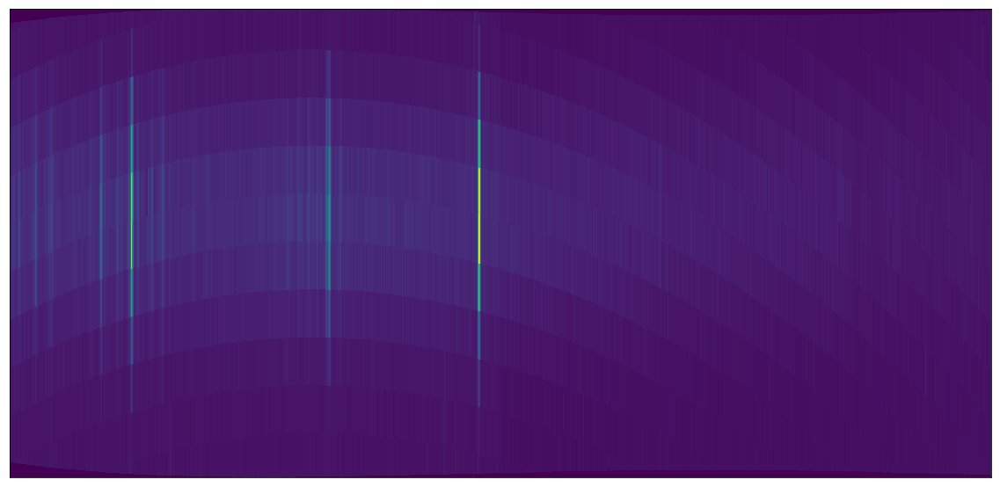

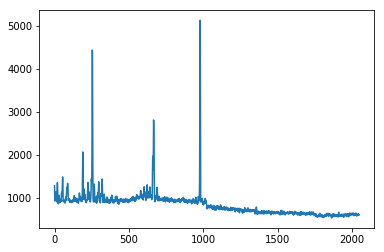

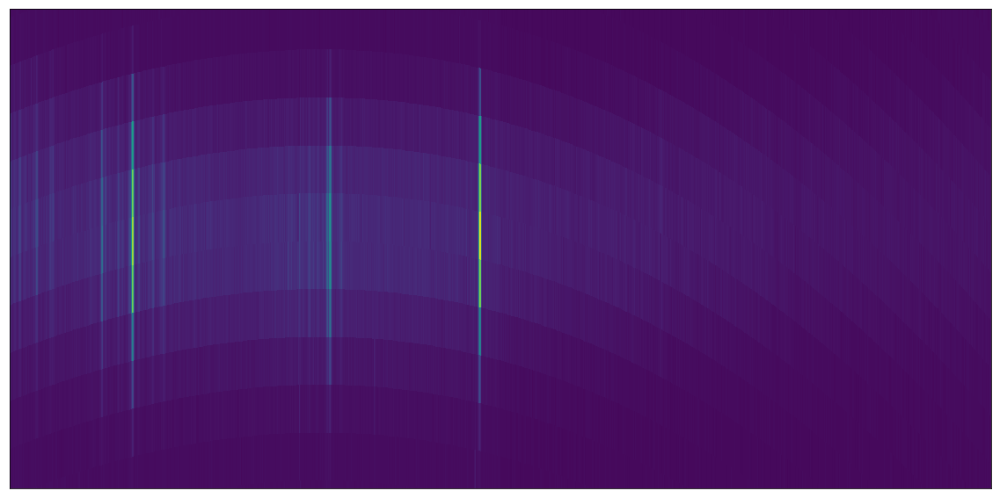

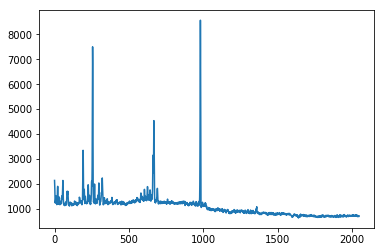

In [92]:
for i in range(1,ntetri+1):
    for j in range(1,16+1):
        cur_cutout = all_scicutouts[i][j]
        cur_oned = all_scioneds[i][j]
        plt.figure(),plt.subplots(1,1,figsize=(20,20))
        plt.imshow(cur_cutout,origin='lower-left')
        plt.xticks([]),plt.yticks([])
        plt.show()
        plt.figure()
        plt.plot(range(len(cur_oned)),cur_oned)
        plt.show()

In [ ]:
first = all_scioneds[1][2]
second = all_scioneds[4][4]
nlambdas = len(second)
from scipy.signal import correlate

zpadd_ref = np.pad(second,[(nlambdas-2,nlambdas-2)],mode='constant',constant_values=0)
sum_cors = []
sum_cors2 = []
nlambda_inds = len(zpadd_ref) 
nsearches = nlambdas-2+nlambdas-2
for i in range(nsearches):
    try:
        r = correlate(first,zpadd_ref[i:i+nlambdas])
    except:
        r = np.zeros(shape=(1,))
    sum_cors.append(np.mean(r))
    sum_cors2.append(np.sqrt(np.mean(r*r)))
 

1149080595.7 1357579789.51
2046 2046


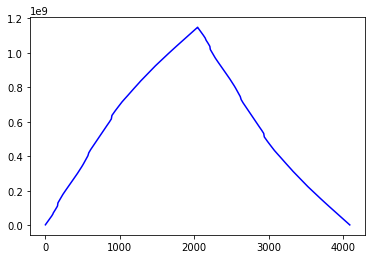

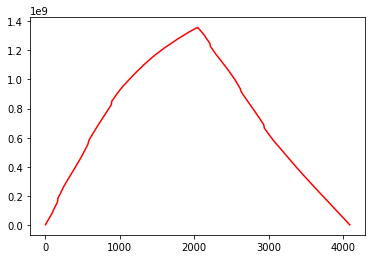

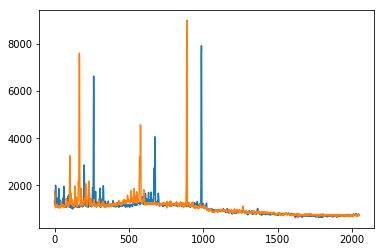

In [91]:
   
plt.figure()
plt.plot(range(nsearches),sum_cors,'b-')
plt.figure()
plt.plot(range(nsearches),sum_cors2,'r-')
print(np.max(sum_cors),np.max(sum_cors2))
print(np.argmax(sum_cors),np.argmax(sum_cors2))
plt.figure()
plt.plot(range(nlambdas),first)
plt.plot(range(nlambdas),zpadd_ref[2046:2046+nlambdas])

C:\Users\kremin\Anaconda3\lib\site-packages\matplotlib\figure.py:403: UserWarning: matplotlib is currently using a non-GUI backend, so cannot show the figure
  "matplotlib is currently using a non-GUI backend, "


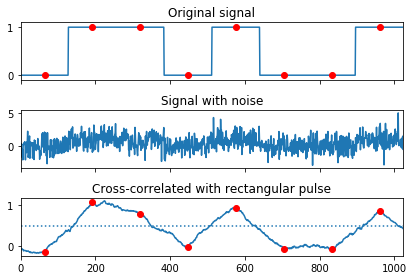

In [84]:
>>> from scipy import signal
>>> sig = np.repeat([0., 1., 1., 0., 1., 0., 0., 1.], 128)
>>> sig_noise = sig + np.random.randn(len(sig))
>>> corr = signal.correlate(sig_noise, np.ones(128), mode='same') / 128

>>> clock = np.arange(64, len(sig), 128)
>>> fig, (ax_orig, ax_noise, ax_corr) = plt.subplots(3, 1, sharex=True)
>>> ax_orig.plot(sig)
>>> ax_orig.plot(clock, sig[clock], 'ro')
>>> ax_orig.set_title('Original signal')
>>> ax_noise.plot(sig_noise)
>>> ax_noise.set_title('Signal with noise')
>>> ax_corr.plot(corr)
>>> ax_corr.plot(clock, corr[clock], 'ro')
>>> ax_corr.axhline(0.5, ls=':')
>>> ax_corr.set_title('Cross-correlated with rectangular pulse')
>>> ax_orig.margins(0, 0.1)
>>> fig.tight_layout()
>>> fig.show()

In [ ]:
reference = all_compcutouts[1][1].sum(axis=0)

zpadd_ref = np.pad(reference,[(100,0)],mode='constant',constant_values=0)

for i in range(1,8+1):
    for j in range(1,16+1):
        if i==1 and j==1:
            continue
        cutout = all_compcutouts[i][j]
        oned = cutout.sum(axis=0)
        

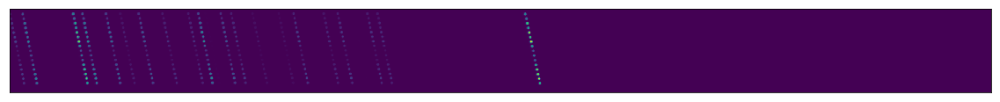

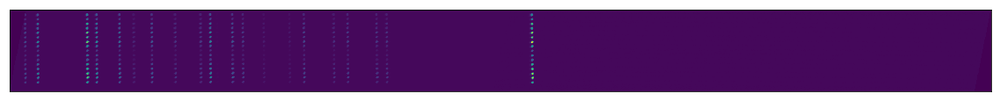

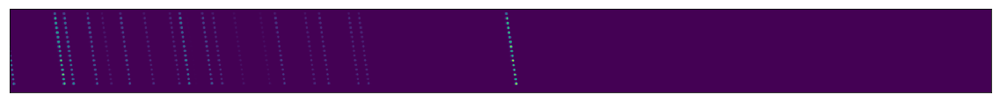

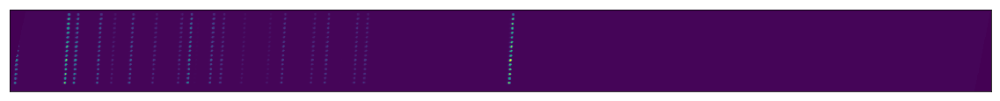

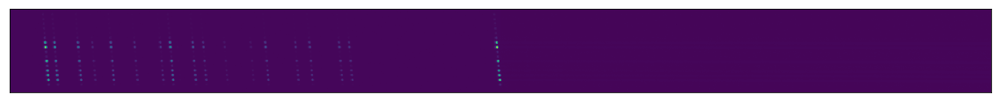

...

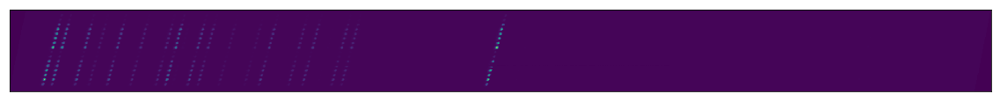

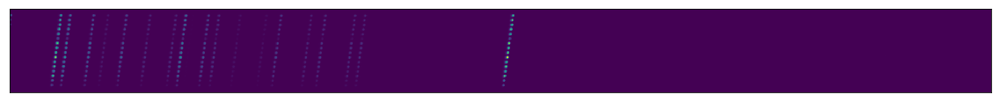

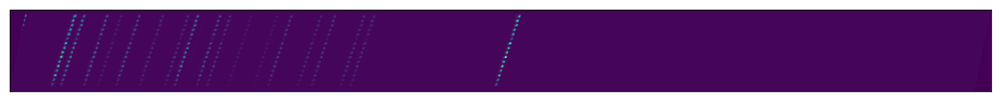

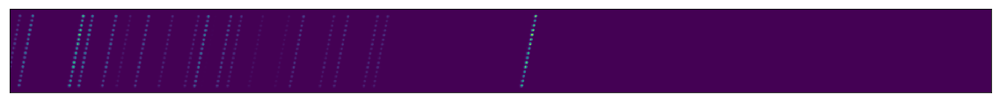

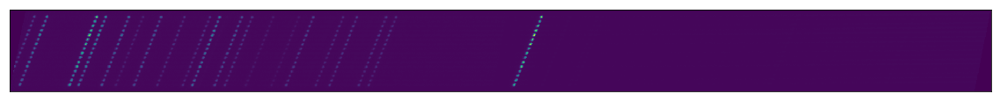

In [79]:
for i in range(1,9):
    tetras_image = comp_tetri[i]
    plt.figure(),plt.subplots(1,1,figsize=(20,20))
    plt.imshow(tetras_image,origin='lower-left')
    plt.xticks([]),plt.yticks([])
    plt.show()

    rowstep = 5

    nrows = tetras_image.shape[0]
    ncols = tetras_image.shape[1]

    nshifts = np.ceil(nrows/rowstep).astype(int)
    new_ncols = nshifts+ncols
    shifted = np.zeros(shape=(nrows,new_ncols))
    for shift in range(nshifts-1):
        cur_rows = np.arange(shift*rowstep,(shift+1)*rowstep)
        shifted[cur_rows,shift:(ncols+shift)] = tetras_image[cur_rows,:]

    plt.figure(),plt.subplots(1,1,figsize=(20,20))
    plt.imshow(shifted,origin='lower-left')
    plt.xticks([]),plt.yticks([])
    plt.show()

In [ ]:
edge_detections = np.asarray(np.abs(cv2.Sobel(shifted,cv2.CV_64F,1,0,ksize=5)) )
#edge_detections = np.asarray(np.abs(cv2.Laplacian(shifted,cv2.CV_64F)) )
#edge_detections = np.asarray(np.abs(cv2.Sobel(tetras_image,cv2.CV_64F,1,0,ksize=5)) )
#edge_detections = np.asarray(np.abs(cv2.Laplacian(tetras_image,cv2.CV_64F)) )
plt.figure(),plt.subplots(1,1,figsize=(40,40))
plt.imshow(np.log(np.abs(edge_detections)+0.00001))
plt.xticks([]),plt.yticks([])
plt.show()
#show_image(np.log(np.abs(edge_detections)+0.00001))

oned = shifted.sum(axis=0)
sky_locs = np.where(oned>100000)[0]
copyimg = shifted.copy()
for loc in sky_locs:
    copyimg[:,loc] = 0.00001
    
plt.figure(),plt.subplots(1,1,figsize=(40,40))
plt.plot(range(len(oned)),oned,'b-')
plt.show()

plt.figure(),plt.subplots(1,1,figsize=(40,40))
plt.imshow(np.log(np.abs(copyimg)+0.00001))
plt.xticks([]),plt.yticks([])
plt.show()


In [ ]:
img_cop = comparison_arc['zerod'].copy()
nrows,ncols = comparison_arc['zerod'].shape

def quadform(ys,ytild):
    a = (1/(9.0*ytild))
    return a*(ys-ytild)*(ys-ytild)

def get_offset_b(xloc,yval=90,ytild=1028):
    return xloc - quadform(yval,ytild) - 10

def get_fitd_xvals(nrows,xloc,aperature_loc_y):
    ytild = nrows//2
    ys = np.arange(nrows)
    quad_vals = quadform(ys,ytild)
    bs = []
    if np.isscalar(aperature_loc_y):
        for x in xloc:
            b = get_offset_b(x,aperature_loc_y,ytild)
            bs.append(b)
    else:
        for x,y in zip(xloc,aperature_loc_y):
            b = get_offset_b(x,y,ytild)
            bs.append(b)
    return ys,quad_vals,bs
    
plt.figure(),plt.subplots(1,1,figsize=(20,20))
plt.imshow(img_cop,origin='lower-left')

aperature_loc_y = 90
ys,quad_vals,bs = get_fitd_xvals(nrows,sky_locs,aperature_loc_y)

for b in bs:
    xs = quad_vals + b
    curys = ys[xs>=0]
    xs = xs[xs>=0]
    plt.plot(xs,curys,'r-',alpha=0.2)
    
plt.xticks([]),plt.yticks([])
plt.show()



In [ ]:
plt.figure()
plt.plot(xs,2*ytild-ys)

In [ ]:
np.pad?

In [ ]:

xs = np.arange(len(all_scioneds[1][1]))

mini = np.arange(100,300)

plt.figure()
plt.subplots(1,1,figsize=(20,20))
for i in range(1,8+1):
    for j in range(1,16+1):
        plt.plot(xs,all_scioneds[i][j],'b-',alpha=0.2)
        
plt.show()

plt.figure()
plt.subplots(1,1,figsize=(20,20))
for i in range(1,8+1):
    for j in range(1,16+1):
        plt.plot(mini,all_scioneds[i][j][mini],'b-',alpha=0.2)
        
plt.show()